  # PostProcessing
  This notebook is initially designed for post-processing ASETS-II numerical and experimental data.
  It can also be used for other configurations's numerical results. If you want to compare with
  experimental data in a different format, customize the section that reads `RTD` and `RTDt`.

  Load the OHP package and the plotting/data-file utilities used in this notebook.

In [1]:
using OscillatingHeatPipe
using Plots
using JLD2
using XLSX

  # Read Simulation Data

  Choose the saved simulation result file. The notebook expects this file to exist before
  post-processing begins.

In [2]:
read_path = joinpath("../numedata","example.jld2")

"../numedata/example.jld2"

  Define the boundary-condition callbacks needed when the saved `SimulationResult` is reconstructed
  from the JLD2 file.

In [3]:
tstep = 4e-4

function get_qbplus(t,x,base_cache,phys_params,motions)
    nrm = normals(base_cache)
    qbplus = zeros_surface(base_cache)
    return qbplus
end

function get_qbminus(t,x,base_cache,phys_params,motions)
    nrm = normals(base_cache)
    qbminus = zeros_surface(base_cache)
    return qbminus
end

function heatermodel!(σ,T,t,fr::AreaRegionCache,phys_params)
    σ .= phys_params["areaheater_power"] / phys_params["areaheater_area"] / phys_params["flux_correction"]
end

function condensermodel!(σ,T,t,fr::AreaRegionCache,phys_params)
    T0 = phys_params["areaheater_temp"]
    h = phys_params["areaheater_coeff"]
    corr = phys_params["flux_correction"]

    σ .= h*(T0 - T) / corr
end

function ohpmodel!(σ,T,t,fr::LineRegionCache,phys_params)
    σ .= phys_params["ohp_flux"] ./ phys_params["flux_correction"]
end

timestep_fixed(u,sys) = tstep

timestep_fixed (generic function with 1 method)

  Check that the result file exists, then load the saved simulation result.

In [4]:
if !isfile(read_path)
    error("No sample result found at $read_path. Run `GROUP=Notebooks julia --project=test test/runtests.jl` after generating `OHP simulation.jl`, or run `test/literate/OHP simulation.jl` first.")
end

SimuResult = load(read_path)["SimulationResult"];

  Extract the saved tube time points. These times are reused by the animations and 1D property plots.

In [5]:
t = SimuResult.tube_hist_t;

  # Plot 2D Graphs

  Animate the vapor film and liquid slug distribution through the OHP tube.

[ Info: Saved animation to /var/folders/z7/8p7f62h924bf9b863dgvfs6m0000gn/T/jl_2bAx4lon8x.gif


Plots.AnimatedGif("/var/folders/z7/8p7f62h924bf9b863dgvfs6m0000gn/T/jl_2bAx4lon8x.gif")
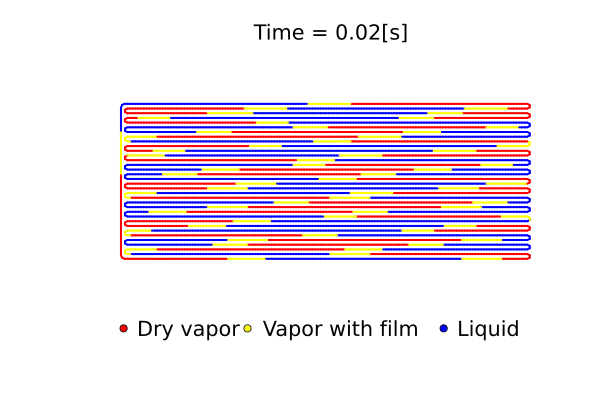

In [6]:
@gif for i in eachindex(t)
    plot(OHPSlug(),i,SimuResult)
end

  Animate the plate temperature field. The color limits are fixed so that frames can be compared directly.

[ Info: Saved animation to /var/folders/z7/8p7f62h924bf9b863dgvfs6m0000gn/T/jl_sPGBeHyFIp.gif


Plots.AnimatedGif("/var/folders/z7/8p7f62h924bf9b863dgvfs6m0000gn/T/jl_sPGBeHyFIp.gif")
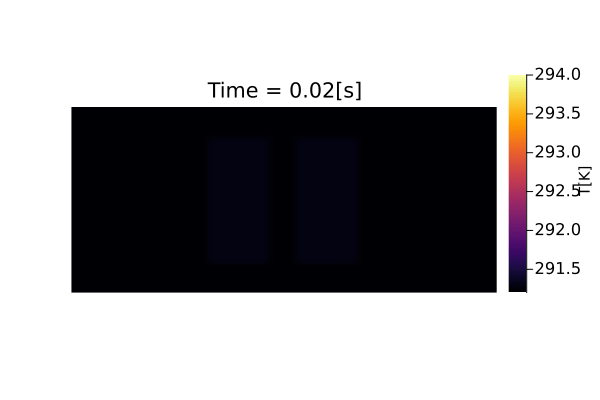

In [7]:
@gif for i in eachindex(t)
    plot(OHPTemp(),i,SimuResult,clim=(291.2,294.0))
end

  Animate the 2D superheat field on the plate.

┌ Warning: `getindex(itp::AbstractInterpolation{T, N}, i::Vararg{ExpandedIndexTypes, N}) where {T, N}` is deprecated, use `itp(i...)` instead.
│   caller = macro expansion at Plotrecipe.jl:276 [inlined]
└ @ Core ~/Documents/GitHub/OscillatingHeatPipe/src/utils/Plotrecipe.jl:276
[ Info: Saved animation to /var/folders/z7/8p7f62h924bf9b863dgvfs6m0000gn/T/jl_s9ihynAhmZ.gif


Plots.AnimatedGif("/var/folders/z7/8p7f62h924bf9b863dgvfs6m0000gn/T/jl_s9ihynAhmZ.gif")
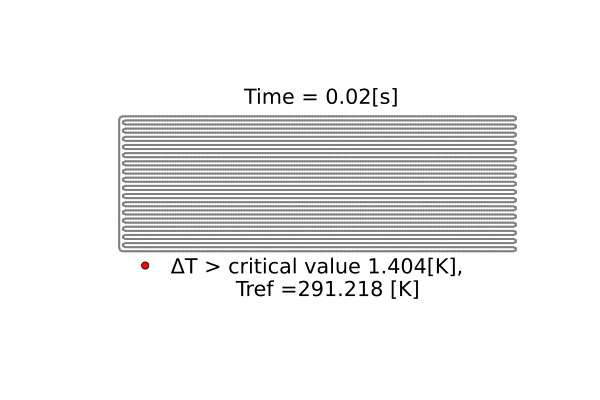

In [8]:
@gif for i in eachindex(t)
    plot(OHPSuper(),i,SimuResult)
end

  Animate the 2D pressure field.

┌ Warning: `getindex(itp::AbstractInterpolation{T, N}, i::Vararg{ExpandedIndexTypes, N}) where {T, N}` is deprecated, use `itp(i...)` instead.
│   caller = macro expansion at Plotrecipe.jl:200 [inlined]
└ @ Core ~/Documents/GitHub/OscillatingHeatPipe/src/utils/Plotrecipe.jl:200
[ Info: Saved animation to /var/folders/z7/8p7f62h924bf9b863dgvfs6m0000gn/T/jl_IjqTCP01et.gif


Plots.AnimatedGif("/var/folders/z7/8p7f62h924bf9b863dgvfs6m0000gn/T/jl_IjqTCP01et.gif")
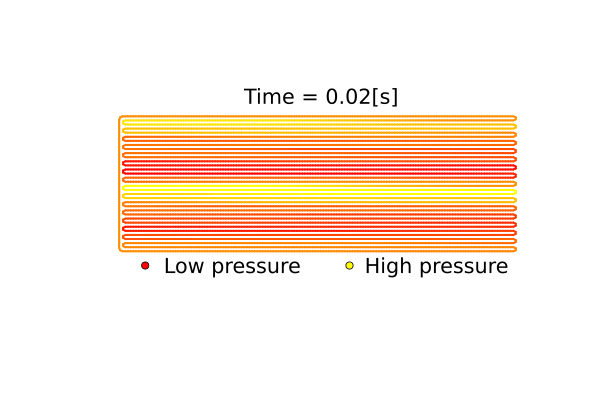

In [9]:
@gif for i in eachindex(t)
    plot(OHPPres(),i,SimuResult)
end

  # Plot 2D Interpolated Curves

  Place virtual sensors on the plate at the same physical locations used by the experiment.

In [10]:
x2Dsensors = [-2.75,-1.4,-0.8,0.0,0.0,0.8,1.4,2.75] .* INCHES
y2Dsensors = [0.0,   0.0, 0.0,0.0,0.4,0.0,0.0,0.0] .* INCHES
plate_sensors = (x2Dsensors,y2Dsensors);

  Interpolate the simulated plate temperature history at those virtual sensor locations.

In [11]:
t_hist,g_hist = getTcurve(plate_sensors,SimuResult);

  Read the ASETS-II experimental RTD data when it is available. If the file is missing or cannot be
  parsed, the notebook continues with numerical results only.

In [12]:
expfile = expfileDict["O001_H001_P040"]
exppaths = (
    joinpath("expdata", expfile),
    joinpath("..", "expdata", expfile),
)
expfile_index = findfirst(isfile, exppaths)

expdata_available = expfile_index !== nothing
if expdata_available
    # This ASETS-II workbook uses strict OOXML. XLSX.jl can convert strict files while reading,
    # but this strict custom XML relationship is missing from its built-in mapping.
    XLSX.STRICT_TO_TRANSITIONAL["http://purl.oclc.org/ooxml/officeDocument/relationships/customXml"] =
        "http://schemas.openxmlformats.org/officeDocument/2006/relationships/customXml"
    xf = XLSX.readxlsx(exppaths[expfile_index])
    Onum, Hnum, power_exp = getconfig(expfile)
    RTDt,RTD = getRTD(xf,Onum);
else
    @info "Experimental file $expfile not found. Plotting numerical post-processing results only."
end

(0:3598, [291.0 290.9 … 290.8 291.0; 291.0 291.0 … 290.9 291.0; … ; 299.3 304.1 … 304.1 299.3; 299.4 304.2 … 303.9 299.3])

  Plot the OHP layout and mark the selected plate sensors.

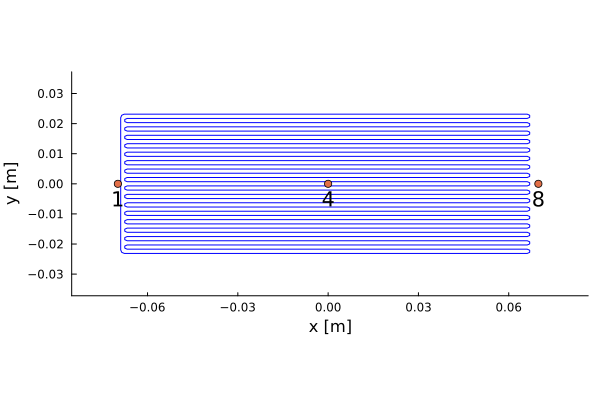

In [13]:
RTD_for_plotting = [1,4,8];

plot(OHP(),SimuResult)
scatter!(x2Dsensors[RTD_for_plotting],y2Dsensors[RTD_for_plotting])
annotate!(x2Dsensors[RTD_for_plotting], y2Dsensors[RTD_for_plotting].-0.005, RTD_for_plotting)

  Plot the simulated temperature curves at the selected sensors and overlay experimental curves when
  the RTD data was loaded successfully.

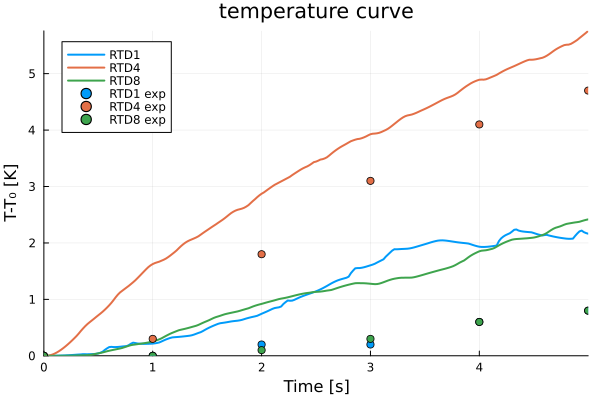

In [14]:
plot(OHPTcurve(),RTD_for_plotting,(t_hist,g_hist),SimuResult)
if expdata_available
    plot!(OHPTexp() ,RTD_for_plotting,(RTDt,RTD)     ,SimuResult)
end

  Estimate thermal conductance between one hot sensor and one cold sensor.

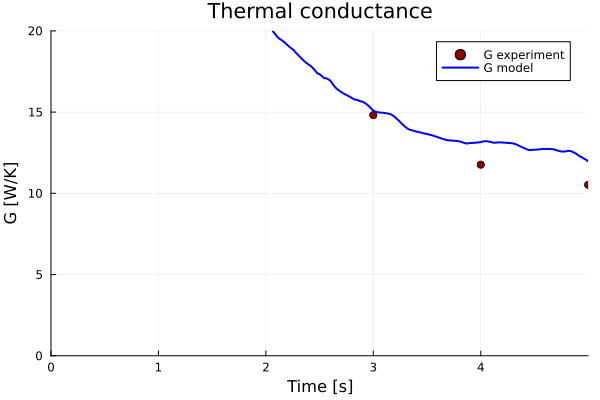

In [15]:
ihot = 4 # hot sensor for calculating thermal conductance
icold = 8 # cold sensor for calculating thermal conductance;

if expdata_available
    plot(OHPCond(),(ihot,icold),(t_hist,g_hist),(RTDt,RTD),SimuResult)
else
    plot(OHPCond(),(ihot,icold),(t_hist,g_hist),SimuResult)
end

  Plot liquid slug velocity statistics over the simulation.

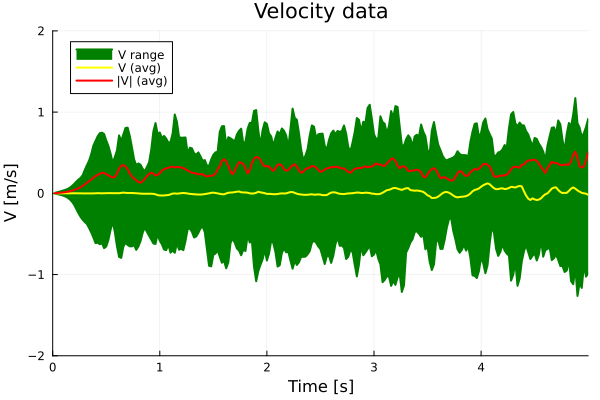

In [16]:
plot(OHPV(), SimuResult::SimulationResult,ylimit=(-2,2))

  # Plot 1D Interpolated Curves

  Choose one saved time index and plot the 1D fluid temperature together with the tube wall temperature.

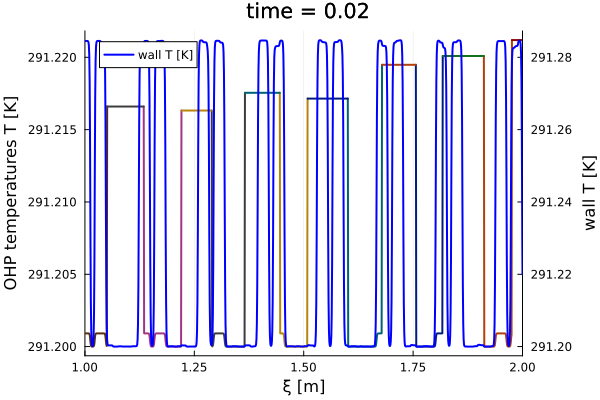

In [17]:
iplot = 1
plot(OHP1DT(),iplot,SimuResult,xlim=(1,2))
plot!(twinx(),OHPTwall(),iplot,SimuResult,xlim=(1,2))
# plot!(twinx(),OHP1DΔT(),iplot,SimuResult,xlim=(1,2))
# plot!(twinx(),OHP1DP(),iplot,SimuResult,xlim=(1,2))

  Choose one 1D tube coordinate `ξ`, convert it to the 2D plate coordinates, and mark the corresponding
  point on the OHP layout.

┌ Warning: `getindex(itp::AbstractInterpolation{T, N}, i::Vararg{Number, N}) where {T, N}` is deprecated, use `itp(i...)` instead.
│   caller = oneDtwoDtransform(ξ::Float64, sr::SimulationResult) at Postprocessing.jl:280
└ @ OscillatingHeatPipe ~/Documents/GitHub/OscillatingHeatPipe/src/utils/Postprocessing.jl:280
┌ Warning: `getindex(itp::AbstractInterpolation{T, N}, i::Vararg{Number, N}) where {T, N}` is deprecated, use `itp(i...)` instead.
│   caller = oneDtwoDtransform(ξ::Float64, sr::SimulationResult) at Postprocessing.jl:281
└ @ OscillatingHeatPipe ~/Documents/GitHub/OscillatingHeatPipe/src/utils/Postprocessing.jl:281


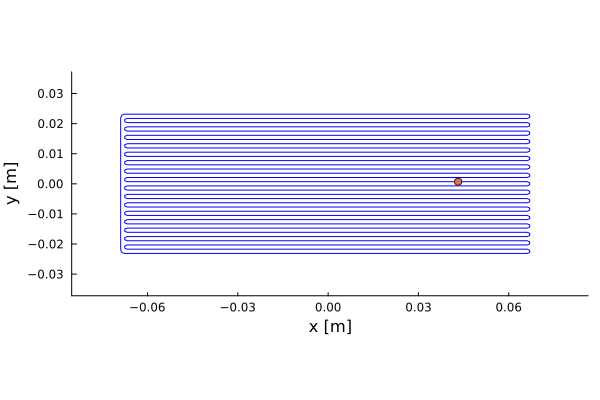

In [18]:
L = SimuResult.integrator_tube.p.tube.L
ξ = L / 2
plot(OHP(),SimuResult)
xprobe,yprobe = oneDtwoDtransform(ξ,SimuResult)
scatter!([xprobe],[yprobe])

  # Plot 1D Property Curves For Fixed Location Sensors

  Choose several 1D tube coordinates and extract temperature and pressure histories at those locations.

In [19]:
xsensors1D = [2.097, 3.0, 4,4.1]

θhist1D,phist1D = get1DTandP(xsensors1D, SimuResult);

┌ Warning: `getindex(itp::AbstractInterpolation{T, N}, i::Vararg{ExpandedIndexTypes, N}) where {T, N}` is deprecated, use `itp(i...)` instead.
│   caller = get1DTandP(xsensors::Vector{Float64}, SimuResult::SimulationResult) at Postprocessing.jl:327
└ @ OscillatingHeatPipe ~/Documents/GitHub/OscillatingHeatPipe/src/utils/Postprocessing.jl:327


  Plot the 1D temperature histories for the selected tube locations.

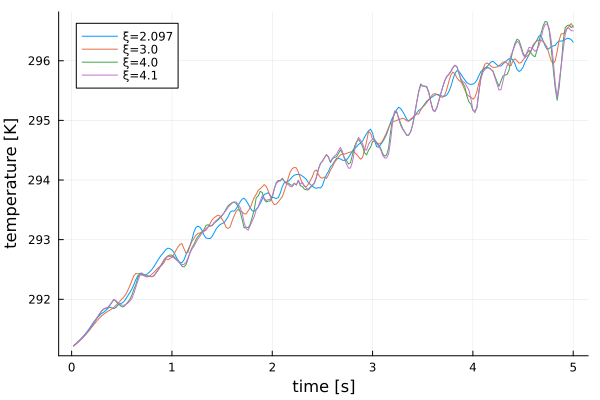

In [20]:
plot(t,θhist1D,label=string.("ξ=", xsensors1D'),xlabel="time [s]", ylabel="temperature [K]")

  # Boiling Statistics

  Build boiling-frequency data from the saved boiling history when boiling events were recorded.

In [21]:
if length(SimuResult.boil_hist) != 0
    boil_data,boil_num_x,boil_num_t,t_boil,x2D_boil,y2D_boil,boil_dt = get_boil_matrix(SimuResult::SimulationResult);
end

┌ Warning: `getindex(itp::AbstractInterpolation{T, N}, i::Vararg{ExpandedIndexTypes, N}) where {T, N}` is deprecated, use `itp(i...)` instead.
│   caller = oneDtwoDtransform(ξ::Vector{Float64}, sr::SimulationResult) at Postprocessing.jl:280
└ @ OscillatingHeatPipe ~/Documents/GitHub/OscillatingHeatPipe/src/utils/Postprocessing.jl:280
┌ Warning: `getindex(itp::AbstractInterpolation{T, N}, i::Vararg{ExpandedIndexTypes, N}) where {T, N}` is deprecated, use `itp(i...)` instead.
│   caller = oneDtwoDtransform(ξ::Vector{Float64}, sr::SimulationResult) at Postprocessing.jl:281
└ @ OscillatingHeatPipe ~/Documents/GitHub/OscillatingHeatPipe/src/utils/Postprocessing.jl:281


([95.0 2.49999999999979; 97.0 2.5699999999997822; … ; 26.0 4.469999999999573; 73.0 4.579999999999561], [0.0; 0.0; … ; 0.0; 0.0;;], [0.0; 0.0; … ; 1.0; 1.0;;], 0.1:0.1:4.6, [-0.052832011544589746, -0.050861424140036054, -0.015361335503225899, -0.0012909194434919252, 0.0030610880836224336, 0.024401032838663836, 0.05145445672301385, 0.06560218802415202, 0.014630235122597784, 0.012532619145239982  …  0.05488528694536673, 0.05769963660575681, 0.06353450096618565, 0.03895239416121399, 0.005060379896434755, 0.0012518364167531904, -0.029790215568423803, -0.068915, -0.068915, -0.06739109467872563], [-0.023125, -0.023125, -0.023125, -0.023125, -0.023124999999999996, -0.023125, -0.023125, -0.02172348484848485, -0.021723484848484843, -0.021723484848484843  …  0.021723484848485124, 0.021723484848485124, 0.023125000000000277, 0.023125000000000277, 0.023125000000000277, 0.023125000000000277, 0.02312500000000029, 0.017275619477099005, -0.014824753120566383, -0.02325814550761819], 0.1)

  Plot the spatial boiling frequency distribution on the OHP layout. If no boiling events were recorded,
  this cell returns an empty plot.

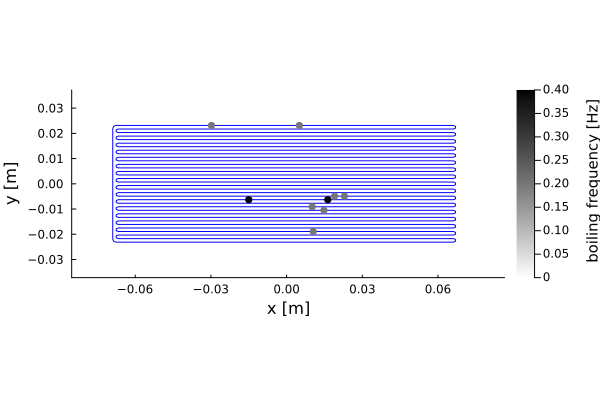

In [22]:
plt = plot()
if length(SimuResult.boil_hist) != 0
    plt = plot(OHP(),SimuResult)
    scatter!(x2D_boil,y2D_boil,
        colorbar=true,markeralpha=delta.(boil_num_x),colorbar_title="\n boiling frequency [Hz]",right_margin=3Plots.mm,marker_z=boil_num_x./SimuResult.tube_hist_t[end],markerstrokewidth=0,markercolor=cgrad(:greys, rev = true))
end
plt

  Plot the overall boiling frequency as a function of time. If no boiling events were recorded, this cell
  returns an empty plot.

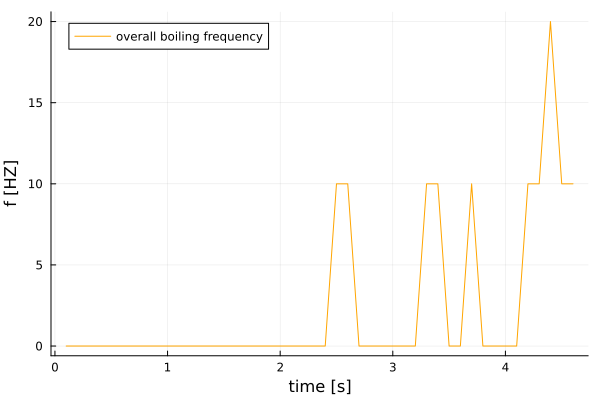

In [23]:
plt = plot()
if length(SimuResult.boil_hist) != 0
    plt = plot(t_boil,boil_num_t./boil_dt,
        color=:orange, legend=:topleft, ylabel="f [HZ]",xlabel="time [s]", label="overall boiling frequency")
end
plt

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*